# Load Libraries

In [ ]:
# !pip uninstall torch-geometric
# !pip install pyg-nightly

In [ ]:
!pip install cdlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.6/228.6 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 34.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 41.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 39.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 32.9 MB/s eta 0:00:00
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395118 sha256=3aca2a7423cec88fe725bdc5888965f27e6530ff55896adb70bd12dfff343794
  Stored in directory: /root/.cache/pip/wheels/e0/56/c2/abb6866a3fcd8a55862f1df8a18f57805c3a7

In [ ]:
!pip install --upgrade scipy networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 22.2 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 2.8.8
    Uninstalling networkx-2.8.8:
      Successfully uninstalled networkx-2.8.8
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chinese-whispers 0.8.1 requires networkx<3.0,>=2.1, but you have networkx 3.1 which is incompatible.


# Import Libraries

In [ ]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import copy
import time

# Load Data

In [ ]:
data={}
with open("movie.json","r",encoding="utf-8") as f:
    data=json.load(f)

In [ ]:
data.__len__()

36861

# Create Graph

In [ ]:
G = nx.Graph()
count=0
limit=100+1

for i in data:
  count+=1
  if count==limit:
    break
  lengthOfCast=len(data[i]['CastId'])
  for j in range(0,lengthOfCast-1):
    val1=data[i]['CastId'][j]
    for k in range(j+1,lengthOfCast):
      val2=data[i]['CastId'][k]
      G.add_edge(int(val1),int(val2))

In [ ]:
G.nodes().__len__()

4322

In [ ]:
G.edges().__len__()

130612

In [ ]:
nx.average_clustering(G)

0.9754147043450085

In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,with_labels=False,width=0.5)
plt.show()

# SpectralClustering

In [ ]:
import numpy as np
from sklearn.cluster import SpectralClustering

# Extract features from the network
A = nx.adjacency_matrix(G) # adjacency matrix
D = np.diag(np.sum(A, axis=1)) # degree matrix
L = D - A # graph Laplacian
eigvals, eigvecs = np.linalg.eig(L) # eigenvectors and eigenvalues of Laplacian
eigvals = eigvals.real
eigvecs = eigvecs.real
X = eigvecs[:, 0:3] # use the first three eigenvectors as features


In [ ]:
X

array([[-3.90736564e-03,  1.13486819e-07,  1.39006485e-06],
       [-3.90736564e-03,  1.13486818e-07,  1.39006485e-06],
       [-5.95766581e-03,  5.50184913e-07,  1.91170657e-06],
       ...,
       [-9.51431493e-08,  9.07336221e-07, -2.18030396e-07],
       [-9.51431493e-08,  9.07336221e-07, -2.18030396e-07],
       [-9.51431493e-08,  9.07336221e-07, -2.18030396e-07]])

In [ ]:
n=G.nodes().__len__()

In [ ]:
# Cluster nodes using spectral clustering
spectral = SpectralClustering(n_clusters=200, affinity='nearest_neighbors', random_state=0)
labels = spectral.fit_predict(X)

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [ ]:
np.unique(labels)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=labels,with_labels=False,width=0.5)
# plt.axis("off")
plt.show()

# Degree disturbation

(array([ 305., 1526., 1624.,  499.,  148.,  195.,    9.,   10.,    3.,
           3.]),
 array([  1. ,  26.2,  51.4,  76.6, 101.8, 127. , 152.2, 177.4, 202.6,
        227.8, 253. ]),
 <a list of 10 Patch objects>)

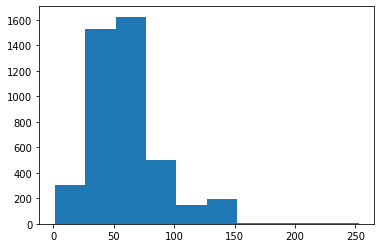

In [ ]:
plt.hist([v for _,v in nx.degree(G)])

# Highest Centrality

In [ ]:
centrality = nx.betweenness_centrality(G) # calculate centrality values
highest_centrality_node = max(centrality, key=centrality.get)

KeyboardInterrupt: ignored

In [ ]:
highest_centrality_node

# Community Detection Algorithms

## My functions

In [ ]:
def find_communities(G):
    communities = {}
    temp_count=0
    n=len(G.nodes())
    for idx1,node1 in enumerate(G.nodes()):
        if n==len(communities):
            break
        count=temp_count+1
        for idx2,node2 in enumerate(G.nodes()):
            if node2 in communities:
                continue
            elif idx2==idx1:
                communities.update({node1:count})
            elif idx2<idx1:
                continue
            else:
                if (node1,node2) in G.edges():
                    communities.update({node2:count})
                    temp_count=count
    return communities,count

def find_communities1(G):
    communities = {}
    total_degree = sum(G.degree(n) for n in G.nodes())
    for node in G.nodes():
        degree = G.degree(node)
        communities[node] = (degree / total_degree) - ((degree / total_degree) * (degree / total_degree))
    return communities

def group_communities(communities):
    count=0
    node_cmap=[]
    values={}
    for i in communities:
        temp=communities[i]
        if temp in values:
            node_cmap.append(values[temp])
        else:
            values.update({temp:count})
            node_cmap.append(values[temp])
            count+=1
            if count==1:
              count+=1
    print(count)
    return node_cmap

def group_communities2(communities):
    communities_dict = {}
    count=0
    for comunity in communities:
      count+=1
      for node in comunity:
        communities_dict.update({node:count})
    node_cmap=group_communities(communities_dict)
    print(count)
    return node_cmap

### Modularity

In [ ]:
def calculate_modularity(M,n):
  Q=0
  for i in range(n):
        a=0
        for j in range(n):
            if i==j:
                e=M[i][j]
            else:
                a+=M[i][j]
        Q+=(e-(a*a))
  return Q

In [ ]:
def modularity_based(G,communities,n):
  total_edge=G.edges.__len__()
  C=[[0]*n for i in range(n)]
  for edge in G.edges():
      c1=communities[edge[0]]
      c2=communities[edge[1]]
      if c2==c1:
          C[c1-1][c2-1]+=1
      else:
          C[c1-1][c2-1]+=1
          C[c2-1][c1-1]+=1

  M=copy.deepcopy(C)
  for i in range(n):
      for j in range(n):
          M[i][j]=M[i][j]/total_edge
  
  Q=calculate_modularity(M,n)
  
  old_n=n
  while True:
      n=n-1
      if n==0:
        n=n+1
        break
      Q_old=Q
      new_C=[[0]*(n) for i in range(n)]
      for i in range(n):
          for j in range(n):
              new_C[i][j]=C[i+1][j+1]
              if (i,j)==(0,0):
                  new_C[i][j]+=C[i][j]
                  new_C[i][j]+=C[i][j+1]
              elif i==0:
                  new_C[i][j]+=C[i][j+1]
              elif j==0:
                  new_C[i][j]+=C[i+1][j]
      
      old_communities=copy.deepcopy(communities)
      for i in communities:
          if communities[i]==1:
              continue
          else:
              communities[i]-=1
      
      old_C=copy.deepcopy(C)
      C=copy.deepcopy(new_C)
      M=copy.deepcopy(C)
      for i in range(n):
          for j in range(n):
              M[i][j]=M[i][j]/total_edge
      
      Q=calculate_modularity(M,n)
      
      if Q_old>=Q:
          C=copy.deepcopy(old_C)
          communities=copy.deepcopy(old_communities)
          n=n+1
          break
  return communities,n

# Analyze of algorithm

## My algorithm for Community Detection

### On small graph

#### Create Graph

In [ ]:
H=nx.Graph()
H.add_edges_from([(1,3),(1,2),(2,3),(3,4),(3,5),(3,6),(4,5),(4,6),(5,6),(7,8),(7,9),(8,9)])

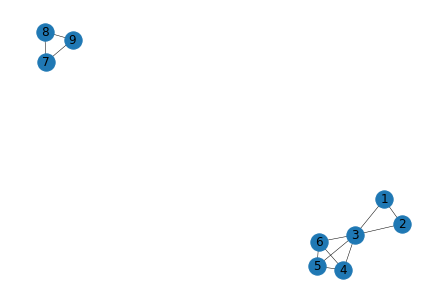

In [ ]:
nx.draw(H,with_labels=True,width=0.5)
plt.show()

#### Before Modularity Based algorithm

In [ ]:
communities,n = find_communities(H)
node_cmap=group_communities(communities)

In [ ]:
print(n)

3


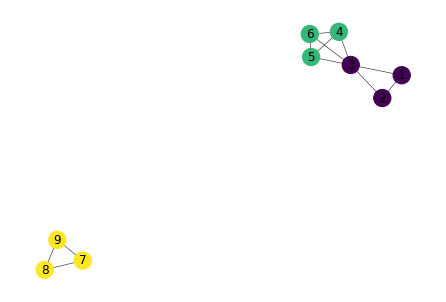

In [ ]:
nx.draw(H,node_color=node_cmap,with_labels=True,width=0.5)
plt.show()

#### After Modularity Based algorithm

In [ ]:
communities,n=modularity_based(H,communities,n)
node_cmap=group_communities(communities)

In [ ]:
print(n)

2


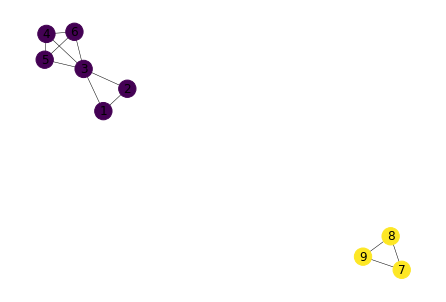

In [ ]:
nx.draw(H,node_color=node_cmap,with_labels=True,width=0.5)
plt.show()

### On IMDB dataset

#### Before Modularity Based algorithm

In [ ]:
start = time.time()

communities,n = find_communities(G)
node_cmap=group_communities(communities)
# node_size = [v * 20000 for v in centrality.values()]

end = time.time()

94


In [ ]:
print(end - start)

3.396059274673462


In [ ]:
print(n)

93


In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5)
# plt.axis("off")
plt.show()

#### After Modularity Based algorithm

In [ ]:
start = time.time()

communities,n=modularity_based(G,communities,n)
node_cmap=group_communities(communities)

end = time.time()

87


In [ ]:
print(n)

86


In [ ]:
print(end - start)

0.2053234577178955


In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5)
# plt.axis("off")
plt.show()

## Python Libraries for Community Detection

### Louvain’s Algorithm

In [ ]:
from community import community_louvain

start = time.time()

comms = community_louvain.best_partition(G)
node_cmap=group_communities(comms)

end = time.time()

51


In [ ]:
print(end - start)

1.462146520614624


In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5)
# plt.axis("off")
plt.show()

### Louvain's Algorithm at cdlib

In [ ]:
from cdlib import algorithms
# coms = algorithms.louvain(G, weight='weight', resolution=1., randomize=False)
# coms = algorithms.louvain(G,resolution=1., randomize=False)
communities = algorithms.louvain(G)

In [ ]:
node_cmap=group_communities2(communities.communities)

In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5)
# plt.axis("off")
plt.show()

###Girvan-Newman algorithm

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities
communities=greedy_modularity_communities(G)

In [ ]:
communities.__len__()

49

In [ ]:
node_cmap=group_communities2(communities)

50
49


In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5)
plt.show()

### greedy_modularity_communities

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

start = time.time()

communities=greedy_modularity_communities(G)
node_cmap=group_communities2(communities)

end = time.time()

50
49


In [ ]:
print(end-start)

9.618008136749268


In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5)
# plt.axis("off")
plt.show()

# Visualize Graph

In [ ]:
communities,n = find_communities(G)
communities,n=modularity_based(G,communities,n)
node_cmap=group_communities(communities)

87


In [ ]:
k=len(G.nodes())
centrality = nx.betweenness_centrality(G, k=k, endpoints=True)

In [ ]:
node_size = [v * 200000 for v in centrality.values()]

In [ ]:
plt.figure(figsize=(100,100))
nx.draw(G,node_color=node_cmap,with_labels=False,width=0.5,node_size=node_size,alpha=0.4)
plt.show()

## 3D visualization

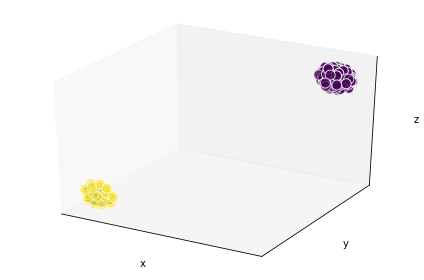

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

pos = nx.spring_layout(G, dim=3, seed=779)
# Extract node and edge positions from the layout
node_xyz = np.array([pos[v] for v in (G)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G.edges()])

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
ax.scatter(*node_xyz.T, s=100, ec="w",c=node_cmap)

# Plot the edges
count=0
for vizedge in edge_xyz:
    ax.plot(*vizedge.T,  color="tab:gray")


def _format_axes(ax):
    """Visualization options for the 3D axes."""
    # Turn gridlines off
    ax.grid(False)
    # Suppress tick labels
    for dim in (ax.xaxis, ax.yaxis, ax.zaxis):
        dim.set_ticks([])
    # Set axes labels
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")


_format_axes(ax)
fig.tight_layout()
plt.show()